<a href="https://colab.research.google.com/github/MahdiYousefiIRN/MahdiYousefiIRN/blob/main/netmachinlearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

اضافه کردن کتابخانه ها به پروژه





UCI :https://archive.ics.uci.edu/ml/datasets/individual+household+electric+power+consumption

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense,Conv1D,MaxPooling1D
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import Dropout
from keras.layers import Bidirectional,GRU, Embedding,Activation
import pandas as pd
from pandas import read_csv
from pandas import to_numeric
import numpy as np
from numpy import nan
from numpy import isnan
import matplotlib.pyplot as plt
import sklearn.preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import math
from google.colab import data_table
from vega_datasets import data


ایجاد اتصال به گوگل درایو

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


*بارگذاری* دیتا ست UCI
در اینجا به جای داده های
 null مقدار nan می گذاریم

In [ ]:
from zmq import NULL
df =pd.read_csv('drive/MyDrive/household_power_consumption.txt', sep=';', header=0, low_memory=False, infer_datetime_format=True, parse_dates={'datetime':[0,1]}, index_col=['datetime'])

df.replace('?', nan, inplace=True)
# df.replace('?', NULL, inplace=True)
# df.fillna(df.median,inplace=True)
# df.dtypes
df = df.astype('float32')
data_table.enable_dataframe_formatter()
data_table.DataTable(df, include_index=False, num_rows_per_page=10)



,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.839996,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.630005,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.289993,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.740005,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.679993,15.8,0.0,1.0,17.0
...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.000,240.429993,4.0,0.0,0.0,0.0
2010-11-26 20:59:00,0.944,0.000,240.000000,4.0,0.0,0.0,0.0
2010-11-26 21:00:00,0.938,0.000,239.820007,3.8,0.0,0.0,0.0


In [ ]:

print("Befor_DF_IsNull=",df.isnull().sum())
datacopy=df.copy()
print("BeforDrop Datacopy =",datacopy.shape)
# در این روش مقادیر داده ای خالی را حذف میکند 
# datacopy.dropna(inplace=True)
print("AfterDrop Datacopy =",datacopy.shape)
# در این روش میانگی داده های ستون را جایگذاری میکند
datacopy.fillna(datacopy.mean,inplace=True)
print("AfterDrop Datacopy =",datacopy.shape)
# در این روش میانه داده های ستون را جایگذاری میکند
datacopy.fillna(datacopy.median,inplace=True)
print("AfterDrop Datacopy =",datacopy.shape)


Befor_DF_IsNull= Global_active_power      25979
Global_reactive_power    25979
Voltage                  25979
Global_intensity         25979
Sub_metering_1           25979
Sub_metering_2           25979
Sub_metering_3           25979
dtype: int64
BeforDrop Datacopy = (2075259, 7)
AfterDrop Datacopy = (2075259, 7)
AfterDrop Datacopy = (2075259, 7)
AfterDrop Datacopy = (2075259, 7)


In [ ]:
df.shape
df.info()
df.head(4)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2075259 entries, 2006-12-16 17:24:00 to 2010-11-26 21:02:00
Data columns (total 7 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Global_active_power    float32
 1   Global_reactive_power  float32
 2   Voltage                float32
 3   Global_intensity       float32
 4   Sub_metering_1         float32
 5   Sub_metering_2         float32
 6   Sub_metering_3         float32
dtypes: float32(7)
memory usage: 71.2 MB


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.839996,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.630005,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.289993,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.740005,23.0,0.0,1.0,17.0




```
# This is formatted as code
```
از موارد بسیار مهم در بحث تمیز کردن داده های ورودی به شبکه مورد آموزش مبحث مهم  مربوط به داده های گمشده که عمدتا مربوط به یک سری داده ها ی نال یا پرت می باشد این متد داده های  خالی یا نال را شناسایی  میکند

In [ ]:
def fill_missing(values):
  one_day = 60 * 24
  for row in range(values.shape[0]):
    for col in range(values.shape[1]):
      if isnan(values[row, col]):
      	values[row, col] = (values[row - one_day, col])
      

In [ ]:
fill_missing(df.values)
df[df['Global_active_power'].isnull()]
df['Global_active_power']

datetime
2006-12-16 17:24:00    4.216
2006-12-16 17:25:00    5.360
2006-12-16 17:26:00    5.374
2006-12-16 17:27:00    5.388
2006-12-16 17:28:00    3.666
                       ...  
2010-11-26 20:58:00    0.946
2010-11-26 20:59:00    0.944
2010-11-26 21:00:00    0.938
2010-11-26 21:01:00    0.934
2010-11-26 21:02:00    0.932
Name: Global_active_power, Length: 2075259, dtype: float32

In [ ]:
from pickle import TRUE
fill_missing(df.values)
missingValue=df['Global_active_power'].isnull()
for ItemMissing in missingValue:
  if(ItemMissing):
    print(ItemMissing)   
  # else :
  #     print(ItemMissing)

 
       





نمونه برداری به صورت  دقیقه ای

In [ ]:
daily_groups = df.resample('T')
daily_dataTime = daily_groups.sum()
daily_dataTime.Global_active_power


datetime
2006-12-16 17:24:00    4.216
2006-12-16 17:25:00    5.360
2006-12-16 17:26:00    5.374
2006-12-16 17:27:00    5.388
2006-12-16 17:28:00    3.666
                       ...  
2010-11-26 20:58:00    0.946
2010-11-26 20:59:00    0.944
2010-11-26 21:00:00    0.938
2010-11-26 21:01:00    0.934
2010-11-26 21:02:00    0.932
Freq: T, Name: Global_active_power, Length: 2075259, dtype: float32

نمونه برداری از داده ها به صورت روزانه 

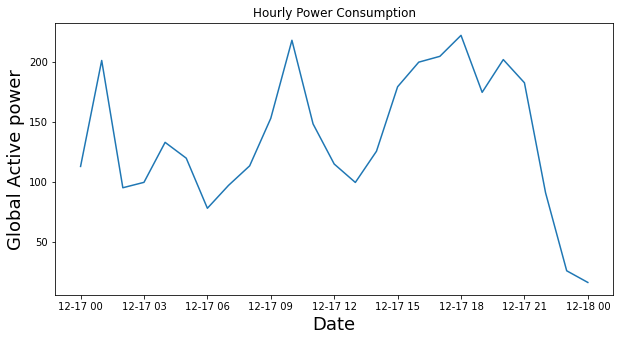

In [ ]:
daily_groups_Hours = df.resample('H')
daily_data_H = daily_groups_Hours.sum()
Daily=daily_data_H.Global_active_power[7:32]
plt.figure(figsize=(10,5))
plt.title("Hourly Power Consumption")
plt.plot(Daily)
plt.xlabel('Date',fontsize = 18 )
plt.ylabel('Global Active power',fontsize = 18 )
plt.show()

In [ ]:
daily_groups = df.resample('D')
daily_data = daily_groups.sum()
daily_data


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16,1209.176025,34.922001,93552.53125,5180.799805,0.0,546.0,4926.0
2006-12-17,3390.459961,226.005997,345725.31250,14398.599609,2033.0,4187.0,13341.0
2006-12-18,2203.825928,161.792007,347373.62500,9247.200195,1063.0,2621.0,14018.0
2006-12-19,1666.193970,150.942001,348479.00000,7094.000000,839.0,7602.0,6197.0
2006-12-20,2225.748047,160.998001,348923.62500,9313.000000,0.0,2648.0,14063.0
...,...,...,...,...,...,...,...
2010-11-22,2041.536011,142.354004,345883.84375,8660.400391,4855.0,2110.0,10136.0
2010-11-23,1577.536011,137.449997,346428.75000,6731.200195,1871.0,458.0,7611.0
2010-11-24,1796.248047,132.460007,345644.59375,7559.399902,1096.0,2848.0,12224.0


نمودار  مصرف برق مشترکین  به صورت روزانه

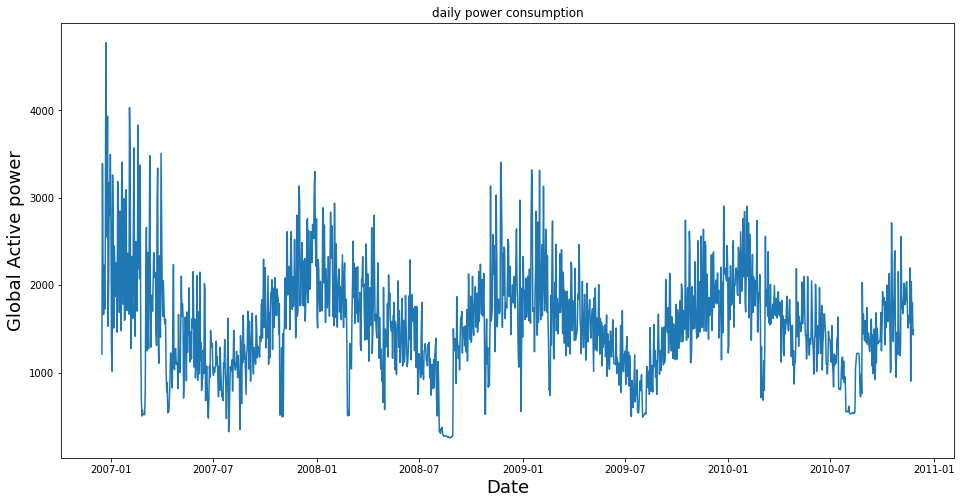

In [ ]:
plt.figure(figsize=(16,8))
plt.title("daily power consumption")
plt.plot(daily_data['Global_active_power'])
plt.xlabel('Date',fontsize = 18 )
plt.ylabel('Global Active power',fontsize = 18 )
plt.show()

نمایش داده ها به صورت ساعتی 

In [ ]:
Hourly_groups = df.resample('H')
Hourly_data = Hourly_groups.sum()
Hourly_data

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16 17:00:00,152.024002,8.243999,8447.179688,651.599976,0.0,19.0,607.0
2006-12-16 18:00:00,217.932007,4.802000,14074.809570,936.000000,0.0,403.0,1012.0
2006-12-16 19:00:00,204.013992,5.114000,13993.950195,870.200012,0.0,86.0,1001.0
2006-12-16 20:00:00,196.113998,4.506000,14044.290039,835.000000,0.0,0.0,1007.0
2006-12-16 21:00:00,183.388000,4.600000,14229.519531,782.799988,0.0,25.0,1033.0
...,...,...,...,...,...,...,...
2010-11-26 17:00:00,103.554001,3.684000,14224.179688,433.000000,0.0,0.0,772.0
2010-11-26 18:00:00,94.407997,3.222000,14251.910156,397.200012,0.0,0.0,0.0
2010-11-26 19:00:00,99.559998,3.602000,14204.459961,423.399994,0.0,4.0,0.0


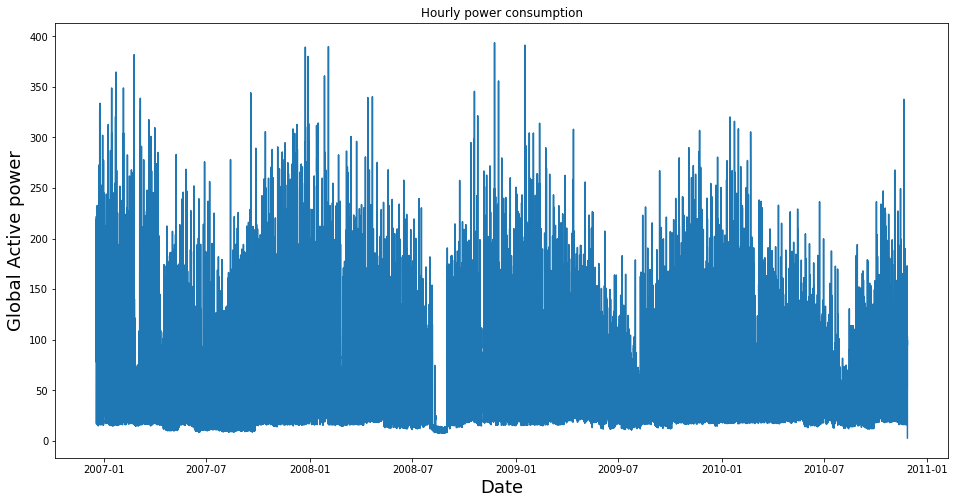

In [ ]:
plt.figure(figsize=(16,8))
plt.title("Hourly power consumption")
plt.plot(Hourly_data['Global_active_power'])
plt.xlabel('Date',fontsize = 18 )
plt.ylabel('Global Active power',fontsize = 18 )
plt.show()

#  
 جدا کردن داده های تست و روزانه
 را می توان توسط توابع کتابخانه ای مثل skitLearn از هم جدا کرد 

In [ ]:
train_test_split(daily_data,test_size=0.3,train_size=0.7)


[            Global_active_power  Global_reactive_power       Voltage  \
 datetime                                                               
 2007-07-13           794.382019             206.694000  346830.90625   
 2007-12-30          2558.916016             178.436005  348622.81250   
 2009-09-06          1228.630005             220.531998  348278.87500   
 2007-03-04          2090.699951             175.682007  345642.90625   
 2007-11-11          1887.124023             185.610001  345974.78125   
 ...                         ...                    ...           ...   
 2008-05-05          1366.932007             185.750000  346661.06250   
 2010-01-24          2269.419922             175.238007  348114.50000   
 2008-04-07          1538.838013             141.279999  350248.78125   
 2009-08-23          1066.708008             371.828003  347839.87500   
 2008-11-08          1733.137939             133.167999  344603.56250   
 
             Global_intensity  Sub_metering_1  Su

In [ ]:
train_size = int(len(daily_data) * 0.80)
test_size = len(daily_data) - train_size
train, test = daily_data.iloc[0:train_size], daily_data.iloc[train_size:len(daily_data)]
print("train : ",len(train)," -------  test : " ,len(test))

print("*******************************")
print( train)
print("*******************************")
print( test)
print("*******************************")








train :  1153  -------  test :  289
*******************************
            Global_active_power  Global_reactive_power       Voltage  \
datetime                                                               
2006-12-16          1209.176025              34.922001   93552.53125   
2006-12-17          3390.459961             226.005997  345725.31250   
2006-12-18          2203.825928             161.792007  347373.62500   
2006-12-19          1666.193970             150.942001  348479.00000   
2006-12-20          2225.748047             160.998001  348923.62500   
...                         ...                    ...           ...   
2010-02-06          2712.986084             296.614014  347172.59375   
2010-02-07          1625.708008             162.466003  349465.62500   
2010-02-08          2582.238037             139.750000  348475.37500   
2010-02-09          2420.931885             139.712006  350136.53125   
2010-02-10          1946.878052             141.621994  349124.37500

train , test

نرمال سازی داده ها بین مقادیر صفر تا یک  با تابع مین مکس از کتابخانه 
Skitlearn

In [ ]:
from sklearn.preprocessing import MinMaxScaler
f_columns = ['Global_reactive_power',	'Voltage',	'Global_intensity',	'Sub_metering_1',	'Sub_metering_2',	'Sub_metering_3']
f_transformer = MinMaxScaler()
f_transformer = f_transformer.fit(train[f_columns].to_numpy())
print(f_transformer)

MinMaxScaler()


In [ ]:
train.loc[:, f_columns] = f_transformer.transform(train[f_columns].to_numpy())
test.loc[:, f_columns]   = f_transformer.transform(test[f_columns].to_numpy())

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

In [ ]:
cnt_transformer = MinMaxScaler()
cnt_transformer = cnt_transformer.fit(train[['Global_active_power']])
train['Global_active_power'] = cnt_transformer.transform(train[['Global_active_power']])
test['Global_active_power'] = cnt_transformer.transform(test[['Global_active_power']])
print("****************************************")
print("trainMax=",train['Global_active_power'].max)
print("trainMin=",train['Global_active_power'].min)
print("****************************************")
train['Global_active_power'].max
train['Global_active_power'].min

****************************************
trainMax= <bound method NDFrame._add_numeric_operations.<locals>.max of datetime
2006-12-16    0.211996
2006-12-17    0.694252
2006-12-18    0.431901
2006-12-19    0.313037
2006-12-20    0.436748
                ...   
2010-02-06    0.544470
2010-02-07    0.304086
2010-02-08    0.515564
2010-02-09    0.479901
2010-02-10    0.375093
Freq: D, Name: Global_active_power, Length: 1153, dtype: float32>
trainMin= <bound method NDFrame._add_numeric_operations.<locals>.min of datetime
2006-12-16    0.211996
2006-12-17    0.694252
2006-12-18    0.431901
2006-12-19    0.313037
2006-12-20    0.436748
                ...   
2010-02-06    0.544470
2010-02-07    0.304086
2010-02-08    0.515564
2010-02-09    0.479901
2010-02-10    0.375093
Freq: D, Name: Global_active_power, Length: 1153, dtype: float32>
****************************************


<ipython-input-42-4c93b573a276>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Global_active_power'] = cnt_transformer.transform(train[['Global_active_power']])
<ipython-input-42-4c93b573a276>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Global_active_power'] = cnt_transformer.transform(test[['Global_active_power']])


<bound method NDFrame._add_numeric_operations.<locals>.min of datetime
2006-12-16    0.211996
2006-12-17    0.694252
2006-12-18    0.431901
2006-12-19    0.313037
2006-12-20    0.436748
                ...   
2010-02-06    0.544470
2010-02-07    0.304086
2010-02-08    0.515564
2010-02-09    0.479901
2010-02-10    0.375093
Freq: D, Name: Global_active_power, Length: 1153, dtype: float32>

create Dataset

In [ ]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps),1:].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps:i + time_steps+1])
    return np.array(Xs), np.array(ys)

In [ ]:

def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    print(df['date'])
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]

  



description

In [ ]:
time_steps = 7
# reshape to [samples, time_steps, n_features]
X_train, y_train = create_dataset(train, train.Global_active_power, time_steps)
X_test, y_test = create_dataset(test, test.Global_active_power, time_steps)
print("**********************************************************")
print("X_train = ",X_train.shape," --------- y_train = ", y_train.shape)

print("**********************************************************")
print("X_test =",X_test.shape," ---------  y_test = ", y_test.shape)
print("**********************************************************")
print(X_train)


**********************************************************
X_train =  (1146, 7, 6)  --------- y_train =  (1146, 1)
**********************************************************
X_test = (282, 7, 6)  ---------  y_test =  (282, 1)
**********************************************************
[[[0.         0.         0.21100625 0.         0.04509043 0.1620129 ]
  [0.49902847 0.9597301  0.69522595 0.18187511 0.34577587 0.5367624 ]
  [0.33132938 0.96600324 0.4246181  0.09509751 0.21645057 0.5669116 ]
  ...
  [0.3292558  0.9719023  0.42807463 0.         0.21868032 0.5689156 ]
  [0.28599784 0.96494824 0.3205648  0.15789944 0.22231399 0.40828323]
  [0.39691624 0.9657449  0.4587527  0.28189301 0.02890412 0.43834335]]

 [[0.49902847 0.9597301  0.69522595 0.18187511 0.34577587 0.5367624 ]
  [0.33132938 0.96600324 0.4246181  0.09509751 0.21645057 0.5669116 ]
  [0.3029939  0.97021013 0.31150848 0.07505815 0.6277975  0.218615  ]
  ...
  [0.28599784 0.96494824 0.3205648  0.15789944 0.22231399 0.40828323]
 

مدل ارایه شده

In [ ]:
# Embedding
max_features = 20000
maxlen = 100
embedding_size = 128

# Convolution
kernel_size = 2
filters = 64
pool_size = 4

# LSTM
lstm_output_size = 128

# Training
batch_size = 128
epochs = 100

In [ ]:
model_CNN_BI_LSTM = Sequential()
model_CNN_BI_LSTM.add(Conv1D(filters,kernel_size, padding='valid',activation='relu',
                 strides=1))
model_CNN_BI_LSTM.add(MaxPooling1D(pool_size=pool_size))
model_CNN_BI_LSTM.add(Bidirectional(LSTM(lstm_output_size, activation='relu',return_sequences=True)))
model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu', return_sequences=False))
model_CNN_BI_LSTM.add(RepeatVector(7))
model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu', return_sequences=True))
model_CNN_BI_LSTM.add(LSTM(128, activation='relu', return_sequences=True))
model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu', return_sequences=True))
model_CNN_BI_LSTM.add(Dropout(0.25))
model_CNN_BI_LSTM.add(LSTM(lstm_output_size, activation='relu', return_sequences=False))
model_CNN_BI_LSTM.add(Dropout(0.25))
# model.add(Flatten())
model_CNN_BI_LSTM.add(Dense(14,activation='relu'))
model_CNN_BI_LSTM.add(Dense( units=1))
opt = keras.optimizers.Adamax(learning_rate=0.001)
# model_BI_LSTM.compile(loss='mse', optimizer='adam')
model_CNN_BI_LSTM.compile(loss='mse',optimizer=opt, metrics=['accuracy'])
model_CNN_BI_LSTM.build(input_shape=(None,X_train.shape[1],X_train.shape[2])) # `input_shape` is the shape of the input data
print(model_CNN_BI_LSTM.summary())



Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 6, 64)             832       
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 1, 64)            0         
 1D)                                                             
                                                                 
 bidirectional_6 (Bidirectio  (None, 1, 256)           197632    
 nal)                                                            
                                                                 
 lstm_20 (LSTM)              (None, 128)               197120    
                                                                 
 repeat_vector_6 (RepeatVect  (None, 7, 128)           0         
 or)                                                             
                                                      

In [ ]:
print('Training...')
history = model_CNN_BI_LSTM.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)
# history = model_CNN_BI_LSTM.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)


Training...
Epoch 1/100
7/7 [==============================] - 15s 384ms/step - loss: 0.0989 - accuracy: 0.0012 - val_loss: 0.0562 - val_accuracy: 0.0000e+00
Epoch 2/100
7/7 [==============================] - 1s 158ms/step - loss: 0.0555 - accuracy: 0.0012 - val_loss: 0.0158 - val_accuracy: 0.0000e+00
Epoch 3/100
7/7 [==============================] - 1s 163ms/step - loss: 0.0261 - accuracy: 0.0012 - val_loss: 0.0228 - val_accuracy: 0.0000e+00
Epoch 4/100
7/7 [==============================] - 1s 161ms/step - loss: 0.0260 - accuracy: 0.0012 - val_loss: 0.0124 - val_accuracy: 0.0000e+00
Epoch 5/100
7/7 [==============================] - 1s 164ms/step - loss: 0.0224 - accuracy: 0.0012 - val_loss: 0.0126 - val_accuracy: 0.0000e+00
Epoch 6/100
7/7 [==============================] - 1s 161ms/step - loss: 0.0234 - accuracy: 0.0012 - val_loss: 0.0123 - val_accuracy: 0.0000e+00
Epoch 7/100
7/7 [==============================] - 1s 154ms/step - loss: 0.0226 - accuracy: 0.0012 - val_loss: 0.0125

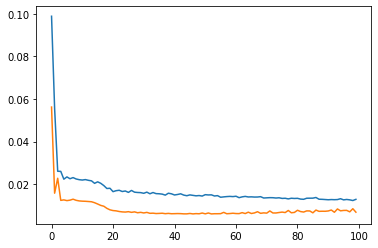

In [ ]:
plt.plot(history.history['loss'] , label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.show()

In [ ]:
y_pred = model_CNN_BI_LSTM.predict(X_test)
print('y_train=',y_train)
y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(1,-1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(1,-1))
y_pred_inv = cnt_transformer.inverse_transform(y_pred.reshape(1,-1))

print(y_test_inv.shape)
print(y_pred_inv.shape)

testScore = math.sqrt(mean_squared_error(y_test, y_pred))
MAPE=mean_absolute_percentage_error(y_test, y_pred)
MAE =mean_absolute_error(y_test, y_pred)


print('Test Score: %.2f RMSE' % (testScore))
print('Test Score: %.2f MAPE' % (MAPE))
print('Test Score: %.2f MAE' % (MAE))

9/9 [==============================] - 2s 43ms/step
y_train= [[0.99999994]
 [0.5084389 ]
 [0.55113274]
 ...
 [0.51556367]
 [0.47990084]
 [0.37509328]]
(1, 282)
(1, 282)
Test Score: 0.08 RMSE
Test Score: 0.34 MAPE
Test Score: 0.06 MAE


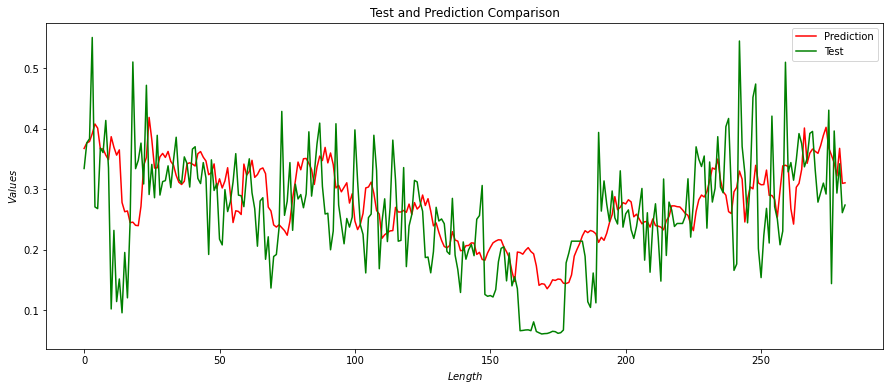

In [ ]:
ax=plt.figure(figsize=(15,6))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(y_pred , label='pred',color='red')
plt.plot(y_test , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

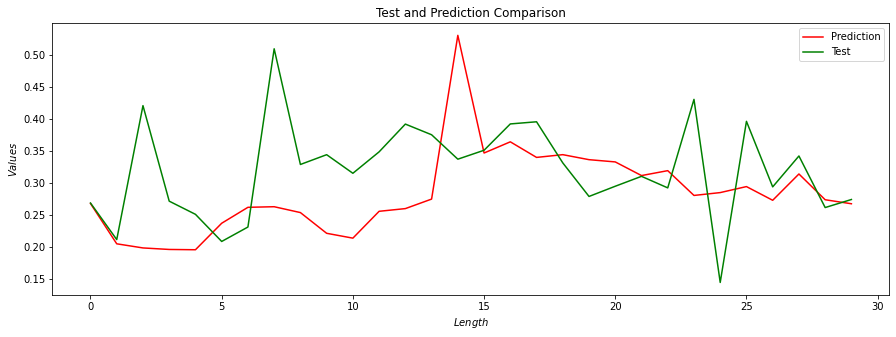

In [ ]:
MonthRealData=y_test[252:282]
MonthPrediction=y_pred[252:282]
ax=plt.figure(figsize=(15,5))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(MonthPrediction , label='pred',color='red')
plt.plot(MonthRealData , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

In [ ]:
model_BI_GRU = Sequential()
model_BI_GRU.add(GRU(128, activation='relu', return_sequences=True))
model_BI_GRU.add(GRU(128, activation='relu', return_sequences=True))
model_BI_GRU.add(GRU(64, activation='relu', return_sequences=False))
model_BI_GRU.add(RepeatVector(7))
model_BI_GRU.add(GRU(64, activation='relu', return_sequences=True))
model_BI_GRU.add(GRU(128, activation='relu', return_sequences=True))
model_BI_GRU.add(Bidirectional(GRU(128, activation='relu',return_sequences=True)))
model_BI_GRU.add(GRU(64, activation='relu', return_sequences=True))
model_BI_GRU.add(Dropout(0.25))
model_BI_GRU.add(GRU(64, activation='relu', return_sequences=False))
model_BI_GRU.add(Dropout(0.25))
# model.add(Flatten())
model_BI_GRU.add(Dense(12,activation='relu'))
model_BI_GRU.add(Dense( units=1))
# opt = keras.optimizers.Adam(learning_rate=0.001)
model_BI_GRU.compile(loss='mse', optimizer='adam')
model_BI_GRU.build(input_shape=(None,X_train.shape[1],X_train.shape[2])) # `input_shape` is the shape of the input data                         # e.g. input_shape = (None, 32, 32, 3)
model_BI_GRU.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_27 (GRU)                (None, 7, 128)            52224     
                                                                 
 gru_28 (GRU)                (None, 7, 128)            99072     
                                                                 
 gru_29 (GRU)                (None, 64)                37248     
                                                                 
 repeat_vector_8 (RepeatVect  (None, 7, 64)            0         
 or)                                                             
                                                                 
 gru_30 (GRU)                (None, 7, 64)             24960     
                                                                 
 gru_31 (GRU)                (None, 7, 128)            74496     
                                                      

In [ ]:
history = model_BI_GRU.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)

Epoch 1/100
7/7 [==============================] - 21s 684ms/step - loss: 0.0987 - val_loss: 0.0504
Epoch 2/100
7/7 [==============================] - 2s 207ms/step - loss: 0.0432 - val_loss: 0.0231
Epoch 3/100
7/7 [==============================] - 1s 178ms/step - loss: 0.0262 - val_loss: 0.0129
Epoch 4/100
7/7 [==============================] - 1s 180ms/step - loss: 0.0249 - val_loss: 0.0123
Epoch 5/100
7/7 [==============================] - 1s 181ms/step - loss: 0.0231 - val_loss: 0.0135
Epoch 6/100
7/7 [==============================] - 1s 187ms/step - loss: 0.0234 - val_loss: 0.0122
Epoch 7/100
7/7 [==============================] - 1s 183ms/step - loss: 0.0237 - val_loss: 0.0120
Epoch 8/100
7/7 [==============================] - 1s 175ms/step - loss: 0.0221 - val_loss: 0.0119
Epoch 9/100
7/7 [==============================] - 1s 180ms/step - loss: 0.0217 - val_loss: 0.0103
Epoch 10/100
7/7 [==============================] - 2s 364ms/step - loss: 0.0188 - val_loss: 0.0073
Epoch 11

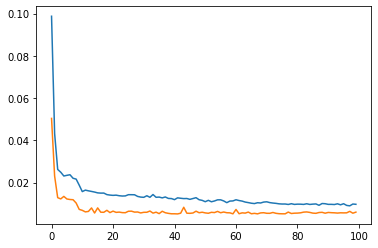

In [ ]:
plt.plot(history.history['loss'] , label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.show()

In [ ]:
y_pred = model_BI_GRU.predict(X_test)
print('y_train=',y_train)
y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(1,-1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(1,-1))
y_pred_inv = cnt_transformer.inverse_transform(y_pred.reshape(1,-1))

print(y_test_inv.shape)
print(y_pred_inv.shape)

testScore = math.sqrt(mean_squared_error(y_test, y_pred))
MAPE=mean_absolute_percentage_error(y_test, y_pred)
MAE =mean_absolute_error(y_test, y_pred)


print('Test Score: %.2f RMSE' % (testScore))
print('Test Score: %.2f MAPE' % (MAPE))
print('Test Score: %.2f MAE' % (MAE))

9/9 [==============================] - 2s 17ms/step
y_train= [[0.99999994]
 [0.5084389 ]
 [0.55113274]
 ...
 [0.51556367]
 [0.47990084]
 [0.37509328]]
(1, 282)
(1, 282)
Test Score: 0.08 RMSE
Test Score: 0.32 MAPE
Test Score: 0.06 MAE


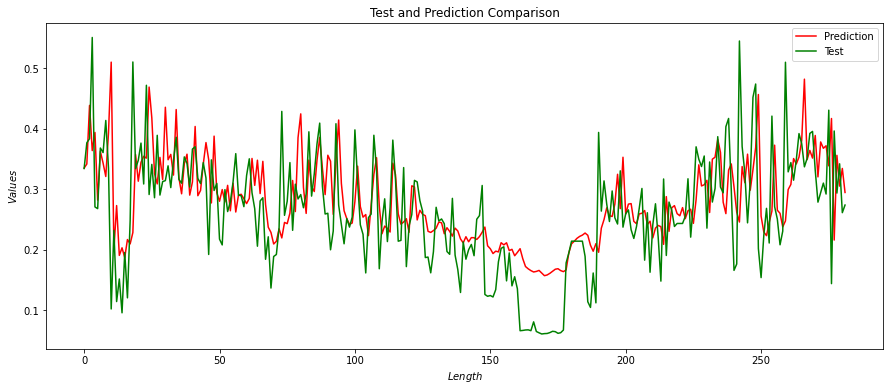

In [ ]:
ax=plt.figure(figsize=(15,6))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(y_pred , label='pred',color='red')
plt.plot(y_test , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

In [ ]:
MonthRealData=y_test[252:282]
MonthPrediction=y_pred[252:282]
ax=plt.figure(figsize=(15,5))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(MonthPrediction , label='pred',color='red')
plt.plot(MonthRealData , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

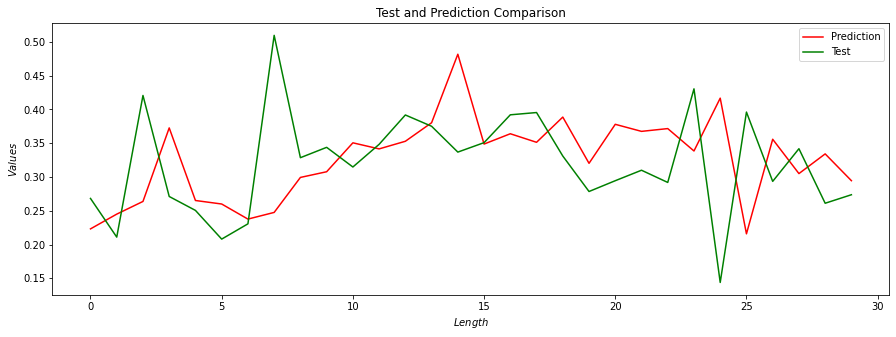

In [ ]:
MonthRealData=y_test[252:282]
MonthPrediction=y_pred[252:282]
ax=plt.figure(figsize=(15,5))
plt.ylabel('$Values$')
plt.xlabel('$Length$')
plt.title("Test and Prediction Comparison")
plt.plot(MonthPrediction , label='pred',color='red')
plt.plot(MonthRealData , label='pred',color='green')
plt.legend(['Prediction', 'Test'], loc='upper right')
plt.show()

 losعملکرد تابع  
 